**Clone Ultralytics**

In [7]:
from pathlib import Path
import subprocess
import sys
import os

os.chdir("/content")

ULTRA_DIR = Path("/content/ultralytics")

if not ULTRA_DIR.exists():
    subprocess.run(
        ["git", "clone", "https://github.com/ultralytics/ultralytics.git", str(ULTRA_DIR)],
        check=True
    )
else:
    print("Ultralytics already exists:", ULTRA_DIR)

print("Done:", ULTRA_DIR)

Ultralytics already exists: /content/ultralytics
Done: /content/ultralytics


**Add CBAM + SimAM Attention**

In [8]:
from pathlib import Path
import py_compile

ULTRA_DIR = Path("/content/ultralytics")
conv_py = ULTRA_DIR / "ultralytics/nn/modules/conv.py"
init_py = ULTRA_DIR / "ultralytics/nn/modules/__init__.py"
tasks_py = ULTRA_DIR / "ultralytics/nn/tasks.py"

# Backup before patch
for p in [conv_py, init_py, tasks_py]:
    backup = p.with_suffix(p.suffix + ".bak_cbam_simam_fixed")
    if not backup.exists():
        backup.write_text(p.read_text())
        print("Backup created:", backup)

cbam_code = """
# =========================================================
# Custom CBAMAttention for YOLO11 segmentation
# =========================================================
class CBAMAttention(nn.Module):
    # CBAM: Convolutional Block Attention Module.
    # Compatible with Ultralytics base_modules parsing.
    # YAML format: [from, repeats, CBAMAttention, [c2, reduction, kernel_size]]
    def __init__(self, c1, c2=None, reduction=16, kernel_size=7):
        super().__init__()
        c2 = c1 if c2 is None else c2
        hidden = max(c1 // reduction, 1)

        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.mlp = nn.Sequential(
            nn.Conv2d(c1, hidden, kernel_size=1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(hidden, c1, kernel_size=1, bias=False),
        )
        self.channel_sigmoid = nn.Sigmoid()

        assert kernel_size in (3, 7), "CBAM spatial kernel_size should be 3 or 7"
        padding = 3 if kernel_size == 7 else 1
        self.spatial_conv = nn.Conv2d(
            2,
            1,
            kernel_size=kernel_size,
            padding=padding,
            bias=False
        )
        self.spatial_sigmoid = nn.Sigmoid()

        self.proj = None
        if c1 != c2:
            self.proj = nn.Conv2d(c1, c2, kernel_size=1, stride=1, padding=0, bias=False)

    def forward(self, x):
        ca = self.mlp(self.avg_pool(x)) + self.mlp(self.max_pool(x))
        x = x * self.channel_sigmoid(ca)

        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        sa = torch.cat([avg_out, max_out], dim=1)
        x = x * self.spatial_sigmoid(self.spatial_conv(sa))

        if self.proj is not None:
            x = self.proj(x)

        return x
"""

simam_code = """
# =========================================================
# Custom SimAM for YOLO11 segmentation
# =========================================================
class SimAM(nn.Module):
    # Simple, Parameter-Free Attention Module.
    # c1 is accepted only for Ultralytics YAML parser compatibility.
    def __init__(self, c1=None, e_lambda=1e-4):
        super().__init__()
        self.e_lambda = e_lambda
        self.activation = nn.Sigmoid()

    def forward(self, x):
        b, c, h, w = x.size()
        n = h * w - 1
        if n <= 0:
            return x

        x_minus_mu_square = (x - x.mean(dim=[2, 3], keepdim=True)).pow(2)
        y = x_minus_mu_square / (
            4 * (x_minus_mu_square.sum(dim=[2, 3], keepdim=True) / n + self.e_lambda)
        ) + 0.5

        return x * self.activation(y)
"""

# =========================================================
# 1. Patch conv.py
# =========================================================
text = conv_py.read_text()

# Fix previous broken escaped triple quotes if they already exist in conv.py
text = text.replace(r'\"\"\"', '"""')

# Ensure imports exist
if "import torch\n" not in text:
    text = text.replace("import math\n", "import math\nimport torch\n") if "import math\n" in text else "import torch\n" + text

if "import torch.nn as nn\n" not in text and "from torch import nn\n" not in text:
    text = text.replace("import torch\n", "import torch\nimport torch.nn as nn\n")

# Add modules to conv.py __all__
for module_name in ["CBAMAttention", "SimAM"]:
    token = f'"{module_name}",'
    if token not in text:
        if '"RepConv",\n    "SpatialAttention",' in text:
            text = text.replace(
                '    "RepConv",\n    "SpatialAttention",',
                f'    "RepConv",\n    "{module_name}",\n    "SpatialAttention",'
            )
        elif '"Concat",' in text:
            text = text.replace('"Concat",', f'"Concat",\n    "{module_name}",')

# Add classes if missing
if "class CBAMAttention(nn.Module):" not in text:
    text = text.rstrip() + "\n" + cbam_code + "\n"

if "class SimAM(nn.Module):" not in text:
    text = text.rstrip() + "\n" + simam_code + "\n"

conv_py.write_text(text)
print("Patched conv.py with CBAMAttention + SimAM")

# Check conv.py syntax immediately
try:
    py_compile.compile(str(conv_py), doraise=True)
    print("conv.py syntax OK")
except Exception as e:
    print("conv.py syntax error:")
    print(e)

    lines = conv_py.read_text().splitlines()
    line_no = getattr(getattr(e, "exc_value", None), "lineno", 1)
    start = max(0, line_no - 8)
    end = min(len(lines), line_no + 8)

    print(f"\n--- conv.py lines {start + 1} to {end} ---")
    for i in range(start, end):
        print(f"{i + 1}: {lines[i]}")

    raise

# =========================================================
# 2. Patch __init__.py
# =========================================================
text = init_py.read_text()

if "from .conv import (" in text:
    for module_name in ["CBAMAttention", "SimAM"]:
        conv_import_block = text.split("from .conv import (", 1)[1].split(")", 1)[0]
        if module_name not in conv_import_block:
            if "    RepConv,\n    SpatialAttention," in text:
                text = text.replace(
                    "    RepConv,\n    SpatialAttention,",
                    f"    RepConv,\n    {module_name},\n    SpatialAttention,"
                )
            elif "    Concat," in text:
                text = text.replace("    Concat,", f"    Concat,\n    {module_name},")
            else:
                text = text.replace("from .conv import (", f"from .conv import (\n    {module_name},")
else:
    for module_name in ["CBAMAttention", "SimAM"]:
        if f"from .conv import {module_name}" not in text:
            text += f"\nfrom .conv import {module_name}\n"

if "__all__" in text:
    for module_name in ["CBAMAttention", "SimAM"]:
        all_block = text.split("__all__", 1)[1]
        if f'"{module_name}"' not in all_block:
            if '"SemanticSegment",\n    "SpatialAttention",' in text:
                text = text.replace(
                    '    "SemanticSegment",\n    "SpatialAttention",',
                    f'    "SemanticSegment",\n    "{module_name}",\n    "SpatialAttention",'
                )
            elif '"Concat",' in text:
                text = text.replace('"Concat",', f'"Concat",\n    "{module_name}",')

init_py.write_text(text)
print("Patched __init__.py")

# =========================================================
# 3. Patch tasks.py
# =========================================================
text = tasks_py.read_text()

if "from ultralytics.nn.modules import (" in text:
    for module_name in ["CBAMAttention", "SimAM"]:
        modules_import_block = text.split("from ultralytics.nn.modules import (", 1)[1].split(")", 1)[0]
        if module_name not in modules_import_block:
            if "    Segment,\n    Segment26," in text:
                text = text.replace(
                    "    Segment,\n    Segment26,",
                    f"    Segment,\n    Segment26,\n    {module_name},"
                )
            elif "    Concat," in text:
                text = text.replace("    Concat,", f"    Concat,\n    {module_name},")
            else:
                text = text.replace(
                    "from ultralytics.nn.modules import (",
                    f"from ultralytics.nn.modules import (\n    {module_name},"
                )

# Add CBAMAttention to base_modules.
base_start = text.find("base_modules = frozenset")
repeat_start = text.find("repeat_modules = frozenset", base_start)

if base_start == -1 or repeat_start == -1:
    raise RuntimeError("Could not locate base_modules block in tasks.py")

base_block = text[base_start:repeat_start]

if "CBAMAttention" not in base_block:
    pattern1 = "base_modules = frozenset(\n        {"
    pattern2 = "base_modules = frozenset({"

    if pattern1 in text:
        text = text.replace(
            pattern1,
            "base_modules = frozenset(\n        {\n            CBAMAttention,"
        )
        print("Added CBAMAttention to base_modules using pattern1")
    elif pattern2 in text:
        text = text.replace(
            pattern2,
            "base_modules = frozenset({\n            CBAMAttention,"
        )
        print("Added CBAMAttention to base_modules using pattern2")
    else:
        raise RuntimeError("Could not insert CBAMAttention into base_modules.")
else:
    print("CBAMAttention already exists in base_modules")

# Add SimAM parse branch if missing
if "elif m is SimAM:" not in text:
    detect_anchor = """elif m in frozenset(
            {
                Detect,"""

    simam_branch = """elif m is SimAM:
            c2 = ch[f]
            args = [c2, *args]
        """

    if detect_anchor in text:
        text = text.replace(detect_anchor, simam_branch + detect_anchor)
    else:
        raise RuntimeError("Could not find insertion point for SimAM parse branch.")

tasks_py.write_text(text)
print("Patched tasks.py")

print("CBAM + SimAM registration complete.")
print("IMPORTANT: Restart runtime/kernel before running YOLO(MODEL_YAML).")


Patched conv.py with CBAMAttention + SimAM
conv.py syntax OK
Patched __init__.py
CBAMAttention already exists in base_modules
Patched tasks.py
CBAM + SimAM registration complete.
IMPORTANT: Restart runtime/kernel before running YOLO(MODEL_YAML).


**Create YAML YOLO11n-seg + CBAM + SimAM**

In [9]:
from pathlib import Path

yaml_path = Path("/content/ultralytics/ultralytics/cfg/models/11/yolo11n-seg-cbam-simam-head.yaml")

yaml_text = """
nc: 2
scales:
  n: [0.50, 0.25, 1024]
  s: [0.50, 0.50, 1024]
  m: [0.50, 1.00, 512]
  l: [1.00, 1.00, 512]
  x: [1.00, 1.50, 512]

backbone:
  - [-1, 1, Conv, [64, 3, 2]]
  - [-1, 1, Conv, [128, 3, 2]]
  - [-1, 2, C3k2, [256, False, 0.25]]
  - [-1, 1, Conv, [256, 3, 2]]
  - [-1, 2, C3k2, [512, False, 0.25]]
  - [-1, 1, Conv, [512, 3, 2]]
  - [-1, 2, C3k2, [512, True]]
  - [-1, 1, Conv, [1024, 3, 2]]
  - [-1, 2, C3k2, [1024, True]]
  - [-1, 1, SPPF, [1024, 5]]
  - [-1, 2, C2PSA, [1024]]

head:
  - [-1, 1, nn.Upsample, [None, 2, "nearest"]]
  - [[-1, 6], 1, Concat, [1]]
  - [-1, 2, C3k2, [512, False]]

  - [-1, 1, nn.Upsample, [None, 2, "nearest"]]
  - [[-1, 4], 1, Concat, [1]]
  - [-1, 2, C3k2, [256, False]]

  - [-1, 1, Conv, [256, 3, 2]]
  - [[-1, 13], 1, Concat, [1]]
  - [-1, 2, C3k2, [512, False]]

  - [-1, 1, Conv, [512, 3, 2]]
  - [[-1, 10], 1, Concat, [1]]
  - [-1, 2, C3k2, [1024, True]]

  # CBAM + SimAM inserted before Segment head for P3, P4, P5 features.
  # CBAMAttention is parsed as base_modules, so channels are scaled automatically for YOLO11n.
  - [16, 1, CBAMAttention, [256, 16, 7]]
  - [23, 1, SimAM, []]

  - [19, 1, CBAMAttention, [512, 16, 7]]
  - [25, 1, SimAM, []]

  - [22, 1, CBAMAttention, [1024, 16, 7]]
  - [27, 1, SimAM, []]

  - [[24, 26, 28], 1, Segment, [nc, 32, 256]]
"""

yaml_path.write_text(yaml_text)
print("Created:", yaml_path)


Created: /content/ultralytics/ultralytics/cfg/models/11/yolo11n-seg-cbam-simam-head.yaml


**Install Ultralytics local**

In [10]:
import subprocess
import sys

subprocess.run([sys.executable, "-m", "pip", "install", "-q", "-e", "/content/ultralytics"], check=True)
print("Installed local Ultralytics")

Installed local Ultralytics


**Test build model**

In [11]:
import sys
from pathlib import Path

sys.path.insert(0, "/content/ultralytics")

from ultralytics import YOLO

MODEL_YAML = "/content/ultralytics/ultralytics/cfg/models/11/yolo11n-seg-cbam-simam-head.yaml"

model = YOLO(MODEL_YAML)
model.info(verbose=True)

print("Build OK")


YOLO11n-seg-cbam-simam-head summary: 231 layers, 2,854,044 parameters, 2,854,028 gradients, 9.7 GFLOPs
Build OK


**Install Dataset**

In [12]:
import importlib.util
import subprocess
import sys
import os
import random
import shutil
from pathlib import Path

if importlib.util.find_spec("roboflow") is None:
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "roboflow"], check=True)

import yaml
from roboflow import Roboflow
from google.colab import userdata

SEED = 42
random.seed(SEED)

api_key = userdata.get("ROBOFLOW_API_KEY")
if not api_key:
    raise RuntimeError("Bạn chưa tạo Colab Secret tên ROBOFLOW_API_KEY")

rf = Roboflow(api_key=api_key)

project = rf.workspace("shirmpdiseasedtection").project("ewu_shrimp_disease")
version = project.version(1)

DATASET_DIR = Path("/content/ewu_shrimp_disease-1")

if not (DATASET_DIR / "data.yaml").exists():
    dataset = version.download("yolo26", location=str(DATASET_DIR))
else:
    print("Dataset already exists:", DATASET_DIR)

train_path = DATASET_DIR / "train"
IMAGE_EXTENSIONS = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

for split in ["valid", "test"]:
    for sub in ["images", "labels"]:
        (DATASET_DIR / split / sub).mkdir(parents=True, exist_ok=True)

valid_images_dir = DATASET_DIR / "valid/images"
test_images_dir = DATASET_DIR / "test/images"

if not any(valid_images_dir.glob("*")) and not any(test_images_dir.glob("*")):
    image_files = [
        f.name for f in (train_path / "images").iterdir()
        if f.suffix.lower() in IMAGE_EXTENSIONS
    ]

    random.shuffle(image_files)

    train_count = int(0.8 * len(image_files))
    val_count = int(0.1 * len(image_files))

    val_files = image_files[train_count:train_count + val_count]
    test_files = image_files[train_count + val_count:]

    def move_files(files, target_split):
        for f in files:
            shutil.move(
                str(train_path / "images" / f),
                str(DATASET_DIR / target_split / "images" / f)
            )

            label_f = f.rsplit(".", 1)[0] + ".txt"
            label_src = train_path / "labels" / label_f
            label_dst = DATASET_DIR / target_split / "labels" / label_f

            if label_src.exists():
                shutil.move(str(label_src), str(label_dst))
            else:
                label_dst.write_text("")

    move_files(val_files, "valid")
    move_files(test_files, "test")

    print(
        f"Split complete: "
        f"{len(image_files) - len(val_files) - len(test_files)} train, "
        f"{len(val_files)} val, "
        f"{len(test_files)} test"
    )
else:
    print("Existing valid/test split detected")

DATA_YAML = DATASET_DIR / "data.yaml"

with open(DATA_YAML, "r") as f:
    data_config = yaml.safe_load(f)

data_config["train"] = str(DATASET_DIR / "train/images")
data_config["val"] = str(DATASET_DIR / "valid/images")
data_config["test"] = str(DATASET_DIR / "test/images")

with open(DATA_YAML, "w") as f:
    yaml.safe_dump(data_config, f, sort_keys=False)

print("DATA_YAML:", DATA_YAML)
print("Classes:", data_config.get("names"))

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/ewu_shrimp_disease-1 in yolo26:: 100%|██████████| 2255/2255 [00:00<00:00, 2474.55it/s]

Split complete: 900 train, 112 val, 114 test
DATA_YAML: /content/ewu_shrimp_disease-1/data.yaml
Classes: ['blackgill', 'whitespot']


**Training model YOLO11n with CBAM + SimAM attention at Head**

In [13]:
from ultralytics import YOLO

MODEL_YAML = "/content/ultralytics/ultralytics/cfg/models/11/yolo11n-seg-cbam-simam-head.yaml"
DATA_YAML = "/content/ewu_shrimp_disease-1/data.yaml"

model = YOLO(MODEL_YAML)

try:
    model.load("yolo11n-seg.pt")
    print("Loaded pretrained yolo11n-seg.pt")
except Exception as e:
    print("Load pretrained warning:", e)

results = model.train(
    data=DATA_YAML,
    epochs=100,
    imgsz=640,
    batch=8,
    device=0,
    workers=2,
    project="/content/runs/shrimp_yolo11n_seg_cbam_simam",
    name="yolo11n_seg_cbam_simam_head",
    pretrained=True,
    optimizer="AdamW",
    lr0=0.001,
    cos_lr=True,
    patience=30,
    close_mosaic=10,
    mask_ratio=4,
    overlap_mask=True,
)


Transferred 378/570 items from pretrained weights
Loaded pretrained yolo11n-seg.pt
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/ewu_shrimp_disease-1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/ultralytics/ultralytics/cfg/models/11/yolo11n-seg-cbam-simam-head

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      1/100      1.58G      3.891      5.155      4.198      3.265          0          4        640: 100% ━━━━━━━━━━━━ 113/113 1.8it/s 1:04
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.7it/s 4.2s
                   all        112        109          0          0          0          0          0          0          0          0

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      2/100      1.88G      3.812      4.826      3.007      3.069          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      2/100      1.89G      3.354      4.346      3.147       2.71          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.0it/s 37.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 1.9s
                   all        112        109      0.517      0.248     0.0276    0.00575    0.00809       0.33     0.0182     0.0031

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      3/100      1.89G      3.585       4.17      3.326      2.484          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      3/100      1.89G       3.14      4.274      3.095      2.526          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.554     0.0891     0.0317    0.00919      0.566     0.0891     0.0277      0.006

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      4/100      1.89G      2.708      3.968      3.031      2.409          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      4/100      1.89G      3.063      4.155      2.948      2.476          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 37.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.8it/s 2.5s
                   all        112        109       0.52      0.153     0.0288    0.00797      0.518      0.129     0.0258    0.00568

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      5/100      1.89G      3.498      4.378      3.031      2.618          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      5/100      1.89G      2.947      4.119      2.956      2.421          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.536     0.0743     0.0251    0.00681      0.533     0.0792     0.0188    0.00366

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      6/100      1.89G      3.485      4.694      3.038      2.483          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      6/100      1.89G      2.955      4.178      2.973      2.423          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.8it/s 1.8s
                   all        112        109      0.579     0.0446     0.0496     0.0157      0.561     0.0347     0.0367    0.00922

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      7/100      1.89G      2.534      3.581      2.729      2.276          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      7/100      1.89G      2.885      4.161      2.973      2.315          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.0it/s 2.4s
                   all        112        109      0.563      0.124     0.0524     0.0154      0.559     0.0842     0.0329    0.00749

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      8/100      1.89G      2.841      4.281       3.02      2.201          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      8/100      1.89G      2.803      4.037      2.831      2.303          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.0it/s 37.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.602      0.105     0.0647     0.0176      0.602      0.105     0.0481     0.0113

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      9/100      1.89G      2.508       3.71      2.485      2.263          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      9/100      1.89G      2.719          4      2.999      2.271          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.563     0.0743     0.0476     0.0129       0.55     0.0594     0.0241    0.00663

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     10/100      1.89G      2.386      4.575      2.602      1.987          0          8        640: 0% ──────────── 0/113  0.4s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     10/100      1.89G      2.707      3.945      2.923      2.268          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 37.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.1it/s 2.3s
                   all        112        109      0.584     0.0891     0.0573     0.0148      0.575     0.0792      0.041    0.00847

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     11/100      1.89G      2.336      3.625      2.634      2.045          0          8        640: 1% ──────────── 1/113 1.7it/s 0.3s<1:06

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     11/100      1.89G      2.735       4.04      2.835      2.226          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.0it/s 37.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.677     0.0761     0.0809     0.0235      0.651     0.0594     0.0579     0.0124

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     12/100      1.89G      2.773      3.948      2.568      2.325          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     12/100      1.89G      2.749      4.014      2.936      2.233          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109       0.59     0.0545     0.0623     0.0188       0.59      0.104     0.0517     0.0113

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     13/100      1.89G      2.961      4.796      3.263      2.367          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     13/100      1.89G      2.725      4.027      2.772      2.173          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.8it/s 2.5s
                   all        112        109      0.593      0.226      0.211     0.0504      0.608      0.104     0.0653     0.0152

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     14/100      1.89G      2.534      3.685      2.627       2.32          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     14/100      1.89G      2.622      3.956      2.797      2.133          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.0it/s 1.8s
                   all        112        109      0.263      0.181       0.12     0.0292      0.434      0.122      0.128     0.0207

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     15/100      1.89G      2.424      3.502      2.701      2.116          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     15/100      1.89G      2.654      3.948      2.721      2.171          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.0it/s 1.8s
                   all        112        109      0.236      0.224      0.118     0.0288       0.25      0.199      0.113     0.0234

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     16/100      1.89G       2.37      4.302      2.509      2.182          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     16/100      1.89G      2.623      3.967      2.748      2.174          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.123      0.104     0.0687     0.0214      0.123      0.104     0.0586     0.0126

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     17/100      1.89G      2.686      3.805      3.098      2.416          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     17/100      1.89G      2.605      3.914      2.715      2.165          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.298      0.162      0.189     0.0552      0.286      0.152      0.167     0.0301

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     18/100      1.89G      2.274      3.597      2.663      2.188          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     18/100      1.89G      2.617      3.966      2.681      2.152          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.5it/s 1.5s
                   all        112        109      0.351      0.204       0.19     0.0449      0.181      0.137     0.0879     0.0262

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     19/100      1.89G      2.772       4.07      2.434      2.066          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     19/100      1.89G      2.567      3.921      2.612      2.121          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 35.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.262      0.203      0.167     0.0353      0.263      0.184      0.106     0.0247

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     20/100      1.89G      2.148      3.832      2.348      1.942          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     20/100      1.89G      2.574      3.935      2.678      2.122          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 1.9s
                   all        112        109      0.333      0.112      0.104     0.0259       0.22      0.229      0.106       0.02

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     21/100      1.89G      3.078      4.155      3.031      2.184          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     21/100      1.89G      2.583      3.865      2.645      2.081          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 35.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.0s
                   all        112        109       0.24      0.277      0.131     0.0373       0.22      0.262      0.117     0.0292

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     22/100      1.89G      2.605      6.154      5.739      2.139          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     22/100       1.9G      2.556      3.951      2.693      2.111          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109       0.35       0.24      0.267     0.0781      0.363      0.189      0.208      0.065

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     23/100       1.9G      2.493      4.146       2.84      2.487          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     23/100       1.9G      2.526      3.923      2.662      2.093          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.5it/s 2.8s
                   all        112        109      0.265      0.311      0.202      0.045      0.221      0.219      0.153      0.045

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     24/100       1.9G      2.831      3.832      2.559      2.402          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     24/100       1.9G      2.529      3.855      2.563      2.087          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.0s
                   all        112        109      0.195      0.196      0.155     0.0459       0.48      0.184      0.182      0.063

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     25/100       1.9G      2.756      4.511      2.871      2.662          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     25/100       1.9G      2.509      3.871      2.572      2.095          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.357      0.334      0.277     0.0995      0.636      0.217       0.24     0.0602

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     26/100       1.9G      2.413      3.714       2.16       1.95          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     26/100       1.9G      2.559      3.894      2.582      2.121          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.489      0.227      0.245     0.0909        0.4      0.223      0.235     0.0746

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     27/100       1.9G      2.173      3.815      1.996      1.872          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     27/100       1.9G       2.52      3.901      2.537      2.055          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 1.9s
                   all        112        109      0.374      0.194       0.24     0.0632      0.414      0.194      0.233     0.0475

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     28/100       1.9G      2.058      3.271      2.004      1.782          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     28/100       1.9G      2.457      3.767      2.475      2.071          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.276      0.188      0.259     0.0783      0.441      0.191      0.255     0.0616

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     29/100       1.9G      3.224      4.043      2.561      1.986          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     29/100       1.9G      2.494      3.811      2.563      2.044          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.541      0.301      0.269       0.11        0.4      0.214      0.187     0.0583

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     30/100       1.9G      2.421      3.848      2.322      2.004          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     30/100       1.9G      2.487      3.817       2.52      2.045          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.8it/s 1.8s
                   all        112        109       0.32      0.355      0.266      0.149      0.239      0.242      0.222      0.055

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     31/100       1.9G      2.182      4.017      2.347      1.855          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     31/100       1.9G      2.461      3.874      2.549      2.041          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.0it/s 37.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.7it/s 1.9s
                   all        112        109       0.38      0.296      0.271       0.13      0.357      0.282      0.249     0.0663

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     32/100       1.9G      2.637      3.859      2.457      2.077          0          8        640: 1% ──────────── 1/113 1.7it/s 0.5s<1:04

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     32/100       1.9G       2.49      3.869      2.578      2.059          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.0it/s 37.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.1s
                   all        112        109      0.879      0.125      0.234     0.0993      0.191      0.247      0.177     0.0581

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     33/100       1.9G      2.945      3.955       2.47       2.09          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     33/100       1.9G      2.483      3.807      2.486      2.053          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.0it/s 37.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.3it/s 2.1s
                   all        112        109      0.269      0.296      0.217     0.0958      0.239      0.277       0.19     0.0581

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     34/100       1.9G      2.854      3.591      2.084      2.176          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     34/100       1.9G      2.413       3.75      2.492       2.03          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.0it/s 37.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 1.9s
                   all        112        109      0.599       0.26      0.249      0.115      0.392      0.255      0.211     0.0654

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     35/100       1.9G       2.08      3.613      2.728      1.872          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     35/100       1.9G      2.485      3.795      2.429      2.054          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.1s
                   all        112        109      0.226      0.301      0.236      0.111      0.185      0.229      0.169     0.0489

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     36/100       1.9G       2.35      4.026      2.929      2.007          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     36/100       1.9G      2.368      3.739      2.558      1.971          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.7it/s 1.9s
                   all        112        109      0.233      0.367      0.237     0.0953      0.347      0.192      0.214     0.0583

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     37/100       1.9G      2.657      3.391      2.469      2.477          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     37/100       1.9G      2.391       3.75      2.444      1.986          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.4it/s 1.6s
                   all        112        109      0.486      0.247      0.265      0.107      0.623      0.252      0.279      0.079

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     38/100       1.9G      2.206      4.013      2.343      1.901          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     38/100       1.9G      2.383       3.74      2.481      1.997          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.9it/s 1.8s
                   all        112        109      0.366      0.364      0.285      0.145      0.619      0.282      0.266     0.0977

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     39/100       1.9G      2.114       3.87      2.298      1.941          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     39/100       1.9G      2.422      3.773      2.429      1.999          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 2.0s
                   all        112        109      0.286      0.349      0.264      0.124      0.784      0.188      0.232     0.0687

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     40/100       1.9G      2.605      3.775      2.639      2.015          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     40/100       1.9G       2.36      3.652      2.507      1.957          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.8it/s 1.9s
                   all        112        109      0.259      0.287      0.245      0.109      0.295      0.324      0.229      0.076

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     41/100       1.9G       2.41      4.751      3.011      1.937          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     41/100       1.9G      2.337      3.707      2.532      1.938          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.496      0.306        0.3      0.127      0.548      0.301      0.282     0.0787

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     42/100       1.9G      2.966      4.152      2.571      2.088          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     42/100       1.9G      2.419      3.671      2.448      2.005          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.3it/s 3.1s
                   all        112        109      0.298      0.326      0.278      0.113      0.316      0.329      0.272     0.0765

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     43/100       1.9G      2.446      3.065       2.25      1.991          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     43/100       1.9G       2.32      3.725      2.351       1.97          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.0it/s 2.3s
                   all        112        109      0.458      0.277      0.333      0.159      0.489      0.267      0.307      0.103

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     44/100       1.9G      2.166       3.38      2.523      1.768          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     44/100       1.9G      2.388      3.595      2.401      1.969          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.1it/s 1.7s
                   all        112        109      0.738       0.25      0.263      0.136      0.738       0.25      0.268     0.0847

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     45/100       1.9G      1.982      3.057      2.187      1.718          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     45/100       1.9G      2.309      3.674      2.377      1.923          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.3it/s 1.6s
                   all        112        109      0.402      0.202      0.254      0.128      0.402      0.202      0.243      0.106

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     46/100       1.9G      2.006      3.222      2.225      1.914          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     46/100       1.9G      2.396      3.705      2.405      1.974          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.8it/s 2.5s
                   all        112        109      0.334      0.364      0.279      0.134      0.314      0.354      0.266     0.0809

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     47/100       1.9G      2.574      4.511      2.737      1.828          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     47/100       1.9G      2.312      3.706      2.332      1.958          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.383      0.342      0.307      0.154      0.371      0.334      0.283     0.0973

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     48/100       1.9G      2.138      3.276      2.744      1.966          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     48/100       1.9G      2.326      3.693      2.401      1.888          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.3it/s 2.2s
                   all        112        109      0.431      0.374      0.298      0.162      0.435      0.374      0.297      0.101

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     49/100       1.9G      2.471      3.878      2.186      1.903          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     49/100       1.9G      2.332      3.652      2.332      1.931          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 2.0s
                   all        112        109      0.264      0.362      0.293      0.144      0.371      0.304      0.276     0.0917

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     50/100       1.9G      2.398      3.845      2.442       1.87          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     50/100       1.9G      2.273      3.606      2.371      1.926          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.7it/s 1.9s
                   all        112        109      0.336      0.364      0.271      0.134      0.323      0.324       0.26     0.0809

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     51/100       1.9G      2.367      4.023      2.104      1.915          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     51/100       1.9G      2.282      3.637      2.285      1.936          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.209      0.399      0.255       0.13      0.203      0.306      0.247     0.0897

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     52/100       1.9G      2.127      3.508      2.027       1.97          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     52/100       1.9G      2.307      3.678      2.308      1.924          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.6it/s 2.7s
                   all        112        109      0.296      0.374      0.314       0.16      0.327      0.364      0.308      0.115

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     53/100       1.9G      2.365      3.721      2.231      1.817          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     53/100       1.9G       2.28      3.593      2.312      1.929          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.1it/s 3.3s
                   all        112        109      0.313      0.421      0.352      0.163      0.883       0.25      0.328      0.118

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     54/100       1.9G      2.413      3.705      2.458      2.252          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     54/100       1.9G      2.231      3.623      2.281      1.872          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.4it/s 2.9s
                   all        112        109      0.266      0.403      0.383       0.18       0.78       0.25      0.372      0.141

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     55/100       1.9G       2.12       3.63      2.228      1.697          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     55/100       1.9G      2.261      3.641       2.26      1.868          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.481       0.25      0.359      0.184      0.481       0.25      0.357      0.111

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     56/100       1.9G      2.164       3.78       1.92      1.749          0          8        640: 0% ──────────── 0/113  0.4s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     56/100       1.9G      2.264      3.614      2.273      1.886          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.369      0.324      0.332       0.15      0.302      0.334      0.307        0.1

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     57/100       1.9G      2.053        3.2      2.026       1.71          0          8        640: 0% ──────────── 0/113  0.4s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     57/100       1.9G       2.25      3.574      2.266      1.904          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 5.0it/s 1.4s
                   all        112        109      0.444      0.279      0.339      0.134       0.52      0.285      0.324      0.103

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     58/100       1.9G       2.05      3.327      2.445      1.897          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     58/100       1.9G       2.27      3.629      2.261      1.921          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.485      0.253      0.255      0.142      0.459      0.228      0.292      0.105

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     59/100       1.9G      2.071      3.441      2.044      2.058          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     59/100       1.9G      2.201      3.561      2.223      1.884          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.0it/s 1.7s
                   all        112        109          1      0.253      0.395      0.195          1      0.254      0.373      0.111

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     60/100       1.9G      2.115      3.115      1.912      1.858          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     60/100       1.9G      2.227      3.579      2.233      1.906          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.0it/s 1.8s
                   all        112        109      0.816      0.263      0.354      0.156      0.816      0.263      0.332      0.112

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     61/100       1.9G      2.441      3.831      2.678       2.02          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     61/100       1.9G      2.228      3.541      2.152      1.859          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.6it/s 1.5s
                   all        112        109      0.608      0.318      0.394      0.172      0.709      0.309      0.382      0.118

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     62/100       1.9G      2.551      3.644      2.395      2.107          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     62/100       1.9G       2.18      3.456      2.228      1.826          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.0it/s 2.3s
                   all        112        109      0.469      0.324      0.354      0.183      0.485      0.324      0.347      0.137

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     63/100       1.9G      2.251      3.432      2.669      1.867          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     63/100       1.9G      2.174      3.515      2.207       1.87          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 1.9s
                   all        112        109      0.284      0.368      0.287      0.164      0.262      0.359      0.277      0.122

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     64/100       1.9G      1.916      2.959      2.337      1.982          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     64/100       1.9G      2.159      3.472      2.126       1.85          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.362      0.366      0.331      0.148      0.345      0.359      0.323      0.115

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     65/100       1.9G      2.008      3.762      2.287      1.761          0          8        640: 1% ──────────── 1/113 1.6it/s 0.4s<1:11

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     65/100       1.9G      2.236      3.574       2.24      1.843          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.1it/s 2.3s
                   all        112        109      0.805       0.25      0.365      0.139      0.805       0.25      0.352      0.118

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     66/100       1.9G      2.117      2.963      1.782      1.806          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     66/100       1.9G      2.207       3.54      2.206      1.853          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.827       0.25      0.327      0.131      0.827       0.25      0.327     0.0976

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     67/100       1.9G      2.414      3.294      2.141      1.778          0          8        640: 0% ──────────── 0/113  0.4s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     67/100       1.9G      2.219      3.568       2.21      1.836          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.521      0.358      0.402      0.182      0.532      0.339      0.385      0.144

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     68/100       1.9G      1.433      2.122      1.775      1.548          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     68/100       1.9G       2.18      3.446      2.174      1.834          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.8it/s 1.5s
                   all        112        109      0.332      0.526      0.381      0.145      0.299      0.441      0.349      0.111

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     69/100       1.9G      1.802      2.964      1.715      1.789          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     69/100       1.9G      2.142      3.417      2.245      1.809          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.489      0.334      0.384      0.146      0.546      0.334      0.352      0.107

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     70/100       1.9G      1.999      3.173      1.852      1.901          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     70/100       1.9G      2.149      3.538      2.142      1.843          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.7it/s 1.9s
                   all        112        109      0.348       0.46      0.337      0.146      0.341      0.381      0.349      0.105

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     71/100       1.9G      2.026      3.318       2.06      1.839          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     71/100       1.9G      2.171      3.434      2.116      1.837          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.0it/s 1.7s
                   all        112        109      0.361      0.456      0.378      0.155      0.343      0.379      0.356      0.126

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     72/100       1.9G       2.22      3.611      2.079      1.948          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     72/100       1.9G      2.172      3.426      2.071      1.826          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.1s
                   all        112        109      0.384      0.376      0.365      0.187      0.366      0.359      0.354      0.132

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     73/100       1.9G      2.583        3.6      2.446      2.178          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     73/100       1.9G      2.123      3.418      2.073      1.825          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.1s
                   all        112        109      0.342      0.379      0.355      0.148      0.332      0.374      0.351      0.103

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     74/100       1.9G      2.222      3.816      2.123      1.834          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     74/100       1.9G      2.092      3.404      2.095      1.806          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.6it/s 1.5s
                   all        112        109      0.483      0.436      0.394      0.168       0.41      0.359      0.342      0.108

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     75/100       1.9G      2.376      3.676      2.194      1.872          0          8        640: 0% ──────────── 0/113  0.4s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     75/100       1.9G      2.162      3.464      2.132      1.805          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.4it/s 1.6s
                   all        112        109       0.35      0.391      0.318      0.143      0.353      0.374        0.3      0.104

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     76/100       1.9G      2.064      3.291      1.868      1.732          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     76/100       1.9G      2.095      3.428      2.106      1.776          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.9it/s 1.8s
                   all        112        109      0.326      0.456      0.342      0.157      0.312      0.379      0.315      0.104

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     77/100       1.9G      2.093      3.246       2.01      1.819          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     77/100       1.9G      2.051       3.37      2.062      1.797          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.3it/s 1.6s
                   all        112        109      0.373      0.461      0.347      0.138       0.35      0.369       0.32     0.0965

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     78/100       1.9G      2.038      3.173      1.821      1.646          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     78/100       1.9G      2.084      3.401      2.066      1.795          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 2.0s
                   all        112        109      0.462      0.363      0.315       0.16      0.431      0.349      0.302     0.0958

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     79/100       1.9G      1.641      3.019      1.883      1.712          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     79/100       1.9G      2.131      3.445      2.089      1.792          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 37.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.417      0.349      0.344      0.138      0.417      0.349      0.322     0.0996

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     80/100       1.9G      1.808      2.632      1.794      1.596          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     80/100       1.9G      2.088      3.406      2.022      1.757          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.346      0.399      0.381      0.202      0.368      0.358      0.364      0.124

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     81/100       1.9G      2.019      3.411      1.772        1.7          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     81/100       1.9G      2.095      3.426      2.064      1.777          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.351      0.388      0.357      0.196      0.309      0.369      0.346      0.122

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     82/100       1.9G      1.564      2.753      1.582      1.432          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     82/100       1.9G      2.064      3.349      2.052      1.756          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 35.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.5it/s 1.6s
                   all        112        109      0.328      0.384      0.355      0.183      0.301      0.374      0.353      0.117

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     83/100       1.9G      2.106      3.358       1.62      1.681          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     83/100       1.9G      2.042      3.336       2.03      1.768          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.7it/s 2.6s
                   all        112        109      0.402      0.399      0.346      0.192      0.392      0.389      0.328      0.115

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     84/100       1.9G      2.135      3.111      1.892      1.856          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     84/100       1.9G      2.114      3.392      2.025      1.797          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.411      0.408      0.379      0.196      0.393      0.378       0.35      0.116

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     85/100       1.9G      2.108      3.526      2.126      1.793          0          8        640: 1% ──────────── 1/113 1.7it/s 0.5s<1:07

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     85/100       1.9G      2.083      3.384      2.054      1.758          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 1.9s
                   all        112        109      0.342      0.403      0.371      0.178      0.882       0.25      0.348      0.128

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     86/100       1.9G      1.671      2.453      2.414      1.586          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     86/100       1.9G      2.088      3.328      2.114      1.779          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.0it/s 1.8s
                   all        112        109      0.329      0.408      0.357      0.188      0.895       0.25      0.334      0.111

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     87/100       1.9G      1.989      3.587      2.102       1.88          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     87/100       1.9G      2.109      3.399      2.023      1.789          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.421      0.374      0.396      0.211      0.406       0.39      0.393      0.134

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     88/100       1.9G      1.311      2.879      1.663      1.406          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     88/100       1.9G      2.034      3.339      2.105      1.734          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.0it/s 37.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.1it/s 2.3s
                   all        112        109      0.442      0.364      0.382      0.183      0.412      0.354      0.364      0.122

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     89/100       1.9G      1.873      3.409      2.629      1.784          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     89/100       1.9G      1.997      3.344      2.005       1.73          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.8it/s 1.8s
                   all        112        109      0.485      0.375       0.39      0.193       0.45       0.36      0.361      0.129

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     90/100       1.9G       1.77      2.996       1.78      1.561          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     90/100       1.9G      2.047      3.395      2.026      1.766          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109        0.4      0.374      0.377      0.201      0.403      0.374      0.356      0.123
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     91/100       1.9G       2.13      4.065      2.164      1.947          0          8        640: 0% ──────────── 0/113  1.4s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     91/100       1.9G      2.009      3.283      2.126      1.823          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.0it/s 1.7s
                   all        112        109      0.441      0.364      0.337      0.171      0.387      0.344      0.312       0.11

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     92/100       1.9G      2.126      3.261      1.761      1.849          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     92/100       1.9G      2.037      3.363       2.07      1.859          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 32.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.8it/s 1.5s
                   all        112        109      0.409      0.364      0.349      0.185      0.372      0.347      0.325      0.119

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     93/100       1.9G      1.584      3.111      1.725      1.471          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     93/100       1.9G       2.02      3.357      2.038      1.845          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.6it/s 31.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.395      0.381      0.332      0.163      0.374      0.384      0.325      0.104

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     94/100       1.9G      1.938      3.289      1.868      1.971          0          8        640: 0% ──────────── 0/113  0.4s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     94/100       1.9G      1.999      3.348      2.057      1.855          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.5it/s 32.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.8it/s 1.5s
                   all        112        109      0.408      0.394      0.345      0.168      0.363      0.379      0.328      0.105

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     95/100       1.9G      2.401      4.016      2.159      2.254          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     95/100       1.9G      2.043      3.346      2.113      1.873          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.5it/s 1.6s
                   all        112        109      0.399      0.391      0.331      0.155      0.358      0.371      0.313      0.111

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     96/100       1.9G      2.465      3.511      2.295       2.11          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     96/100       1.9G      2.007      3.315      2.061      1.877          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.6it/s 31.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.395      0.413      0.352      0.156      0.351      0.379      0.322       0.11

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     97/100       1.9G      1.517      2.592      1.436      1.583          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     97/100       1.9G      2.006      3.377      2.056      1.855          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.5it/s 32.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.9it/s 1.4s
                   all        112        109      0.387      0.391      0.345      0.144      0.358      0.376      0.327      0.109

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     98/100       1.9G      1.522      3.716      1.775      1.584          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     98/100       1.9G      1.963      3.297      2.067      1.835          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.5it/s 1.5s
                   all        112        109      0.403      0.384      0.356      0.166      0.361      0.364      0.335      0.114

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     99/100       1.9G      2.284      3.755      2.498      2.197          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     99/100       1.9G      2.023       3.31      2.042      1.862          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.5it/s 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.7it/s 2.6s
                   all        112        109      0.394      0.389      0.361      0.168      0.353      0.369      0.342       0.12

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
    100/100       1.9G      1.794      2.455      1.625      1.479          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


    100/100       1.9G      2.013      3.336      2.029      1.851          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.6it/s 31.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.8it/s 1.5s
                   all        112        109      0.426      0.394      0.362      0.168      0.372      0.369      0.338      0.122

100 epochs completed in 1.076 hours.
Optimizer stripped from /content/runs/shrimp_yolo11n_seg_cbam_simam/yolo11n_seg_cbam_simam_head/weights/last.pt, 6.0MB
Optimizer stripped from /content/runs/shrimp_yolo11n_seg_cbam_simam/yolo11n_seg_cbam_simam_head/weights/best.pt, 6.0MB

Validating /content/runs/shrimp_yolo11n_seg_cbam_simam/yolo11n_seg_cbam_simam_head/weights/best.pt...
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n-seg-cbam-simam-head summary (fused): 141 layers, 2,846,004 parameters, 0 gradients, 9.6

**Validate and Predict**

In [14]:
from ultralytics import YOLO
from pathlib import Path

FINAL_BEST = Path("/content/runs/shrimp_yolo11n_seg_cbam_simam/yolo11n_seg_cbam_simam_head/weights/best.pt")
TEST_BEST = Path("/content/runs/shrimp_yolo11n_seg_cbam_simam/test_3_epochs/weights/best.pt")
BEST_PT = FINAL_BEST if FINAL_BEST.exists() else TEST_BEST

DATA_YAML = "/content/ewu_shrimp_disease-1/data.yaml"
TEST_SOURCE = "/content/ewu_shrimp_disease-1/test/images"

print("BEST_PT:", BEST_PT)

best_model = YOLO(str(BEST_PT))

metrics = best_model.val(
    data=DATA_YAML,
    imgsz=640,
    device=0,
    split="val",
    plots=True
)

print("Box mAP50:", metrics.box.map50)
print("Box mAP50-95:", metrics.box.map)

if hasattr(metrics, "seg"):
    print("Mask mAP50:", metrics.seg.map50)
    print("Mask mAP50-95:", metrics.seg.map)

pred_results = best_model.predict(
    source=TEST_SOURCE,
    imgsz=640,
    conf=0.25,
    iou=0.5,
    save=True,
    save_txt=True,
    save_conf=True,
    project="/content/runs/predict_shrimp_cbam_simam",
    name="cbam_simam_predict"
)

print("Predict saved to /content/runs/predict_shrimp_cbam_simam/cbam_simam_predict")


BEST_PT: /content/runs/shrimp_yolo11n_seg_cbam_simam/yolo11n_seg_cbam_simam_head/weights/best.pt
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n-seg-cbam-simam-head summary (fused): 141 layers, 2,846,004 parameters, 0 gradients, 9.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3545.4±757.4 MB/s, size: 201.5 KB)
val: Scanning /content/ewu_shrimp_disease-1/valid/labels.cache... 112 images, 53 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 112/112 47.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.0it/s 6.8s
                   all        112        109      0.422      0.374      0.397      0.212      0.406      0.389      0.393      0.134
             blackgill          8          8      0.265        0.5      0.522       0.34      0.239        0.5      0.522      0.208
             whitespot         51        101      0

**Healthy-aware Report Path**


In [15]:
from pathlib import Path

FINAL_BEST = Path("/content/runs/shrimp_yolo11n_seg_cbam_simam/yolo11n_seg_cbam_simam_head/weights/best.pt")
TEST_BEST = Path("/content/runs/shrimp_yolo11n_seg_cbam_simam/test_3_epochs/weights/best.pt")
best_model_path = FINAL_BEST if FINAL_BEST.exists() else TEST_BEST
run_path = best_model_path.parents[1]
REPORT_DIR = run_path / "healthy_aware_report"
REPORT_DIR.mkdir(parents=True, exist_ok=True)

print(f'Selected run path: {run_path}')
print(f'Selected checkpoint: {best_model_path}')
print(f'Report directory: {REPORT_DIR}')
print('Healthy-aware score = labeled_test_mask_map50 - COUNT_PENALTY_WEIGHT * labeled_test_mask_count_mae - DISEASE_MISS_PENALTY_WEIGHT * labeled_test_disease_box_miss_rate - HEALTHY_FP_PENALTY_WEIGHT * healthy_test_mask_fp_rate')


Selected run path: /content/runs/shrimp_yolo11n_seg_cbam_simam/yolo11n_seg_cbam_simam_head
Selected checkpoint: /content/runs/shrimp_yolo11n_seg_cbam_simam/yolo11n_seg_cbam_simam_head/weights/best.pt
Report directory: /content/runs/shrimp_yolo11n_seg_cbam_simam/yolo11n_seg_cbam_simam_head/healthy_aware_report
Healthy-aware score = labeled_test_mask_map50 - COUNT_PENALTY_WEIGHT * labeled_test_mask_count_mae - DISEASE_MISS_PENALTY_WEIGHT * labeled_test_disease_box_miss_rate - HEALTHY_FP_PENALTY_WEIGHT * healthy_test_mask_fp_rate


**Healthy-aware Test Evaluation and Visualization**


Selected experiment: yolo11n_seg_cbam_simam_head
Selected dataset dir: /content/ewu_shrimp_disease-1
Labeled-only test images: 53
Healthy-only test images: 61
Full test-set evaluation:
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n-seg-cbam-simam-head summary (fused): 141 layers, 2,846,004 parameters, 0 gradients, 9.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2927.8±1052.2 MB/s, size: 186.8 KB)
val: Scanning /content/ewu_shrimp_disease-1/test/labels... 114 images, 61 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 114/114 2.5Kit/s 0.0s
val: New cache created: /content/ewu_shrimp_disease-1/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 1.0it/s 7.8s
                   all        114         95      0.407      0.467      0.449      0.168      0.416       0.41      0.366      0.105
Speed: 9.8ms preprocess, 12.4ms

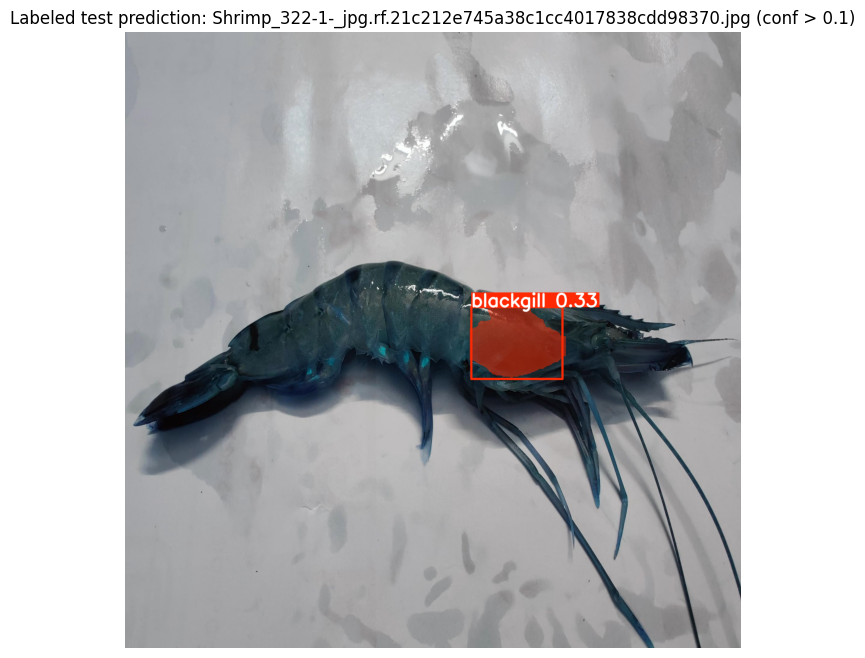

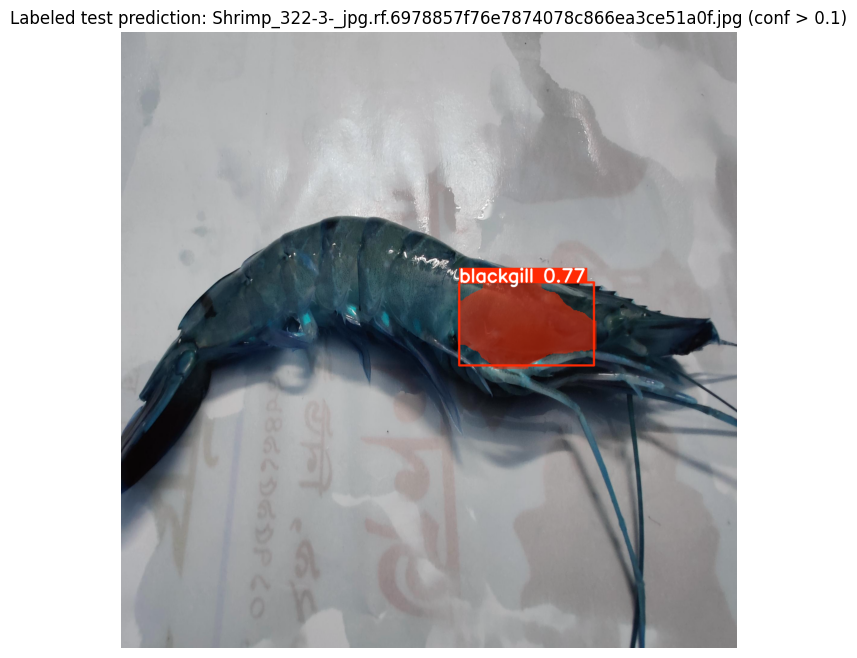

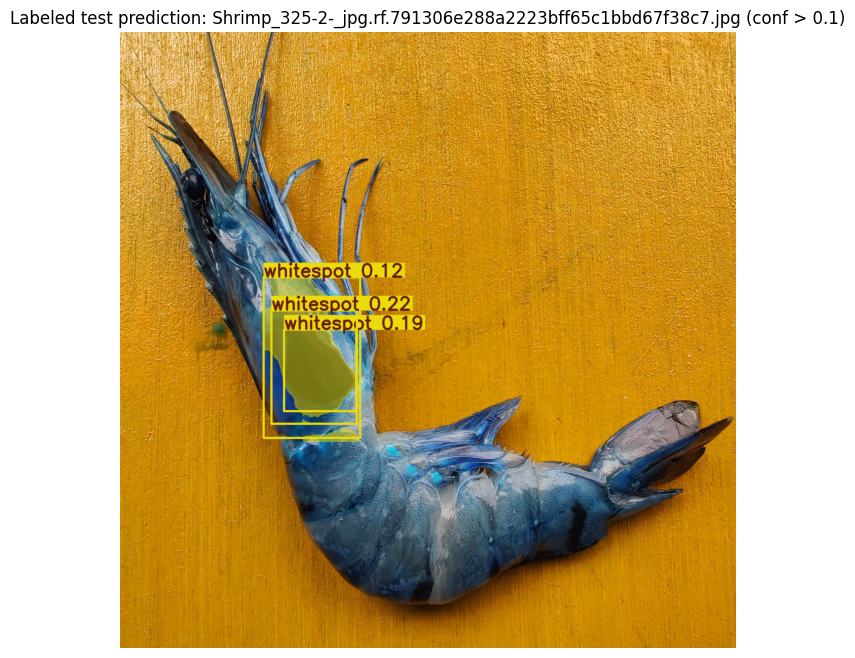

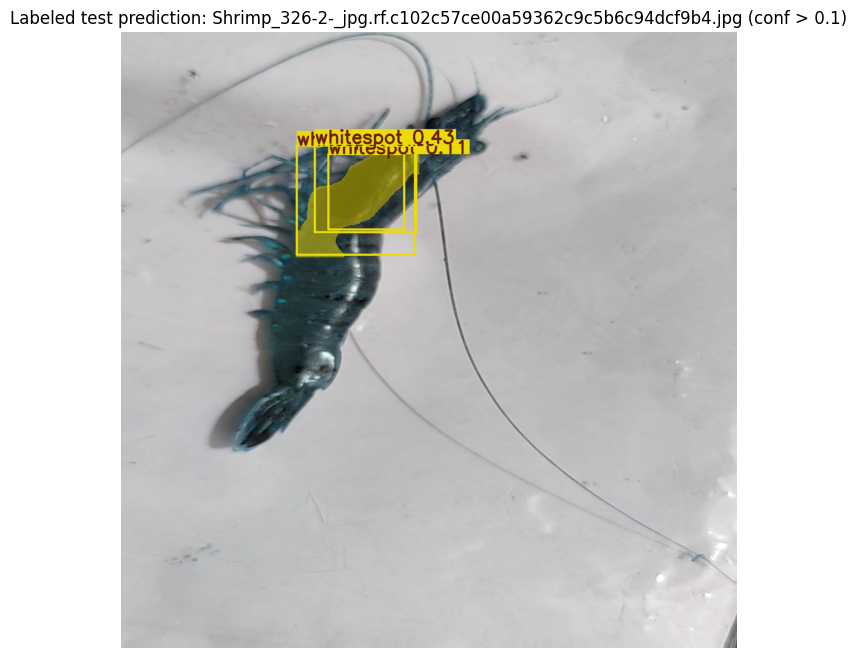

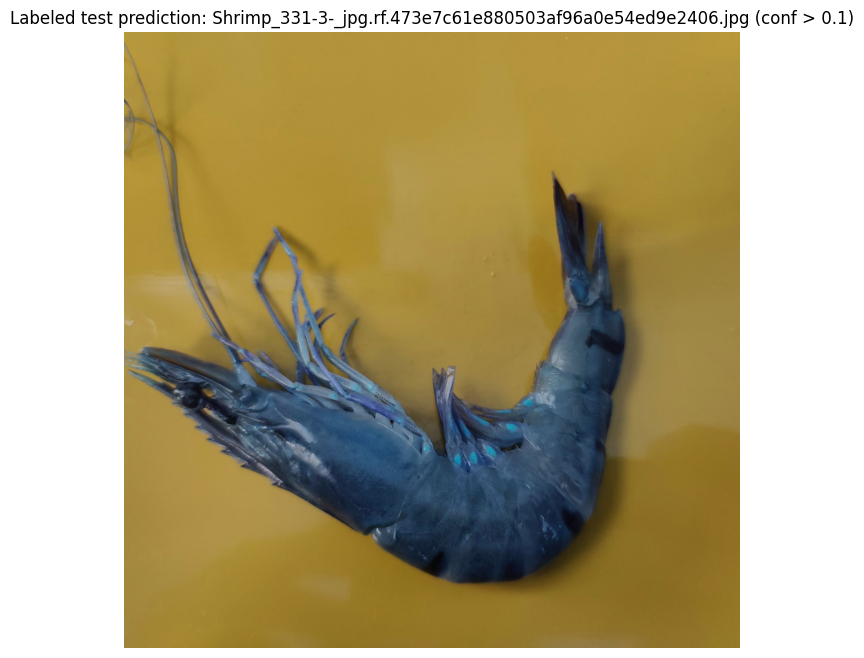

...

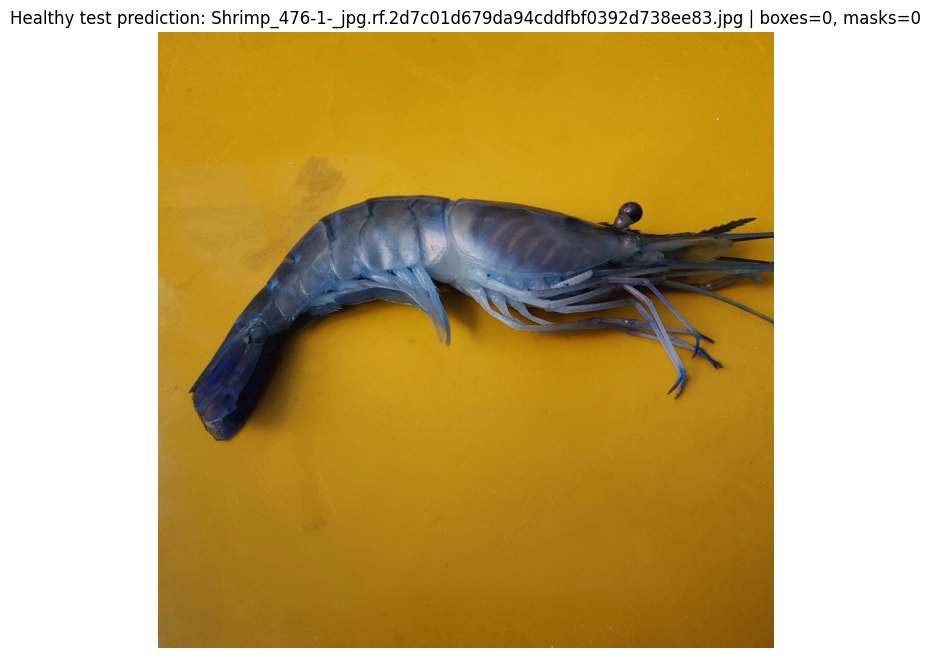

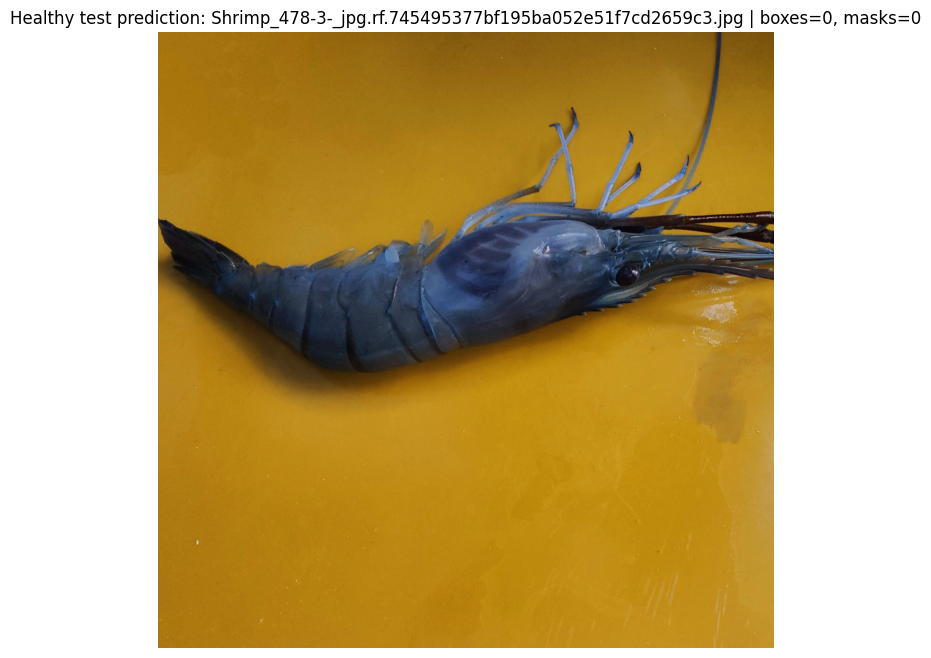

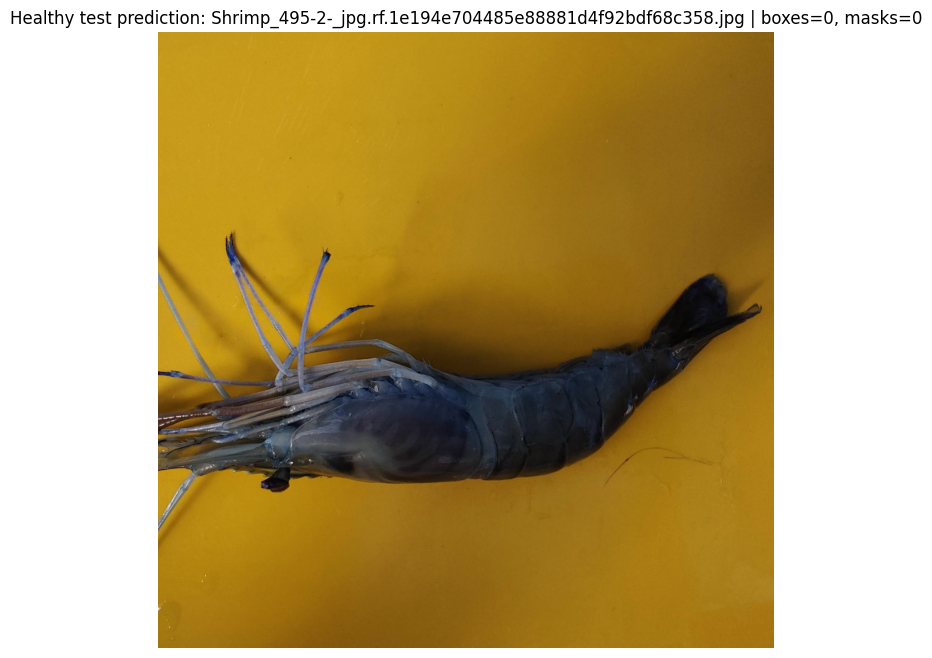

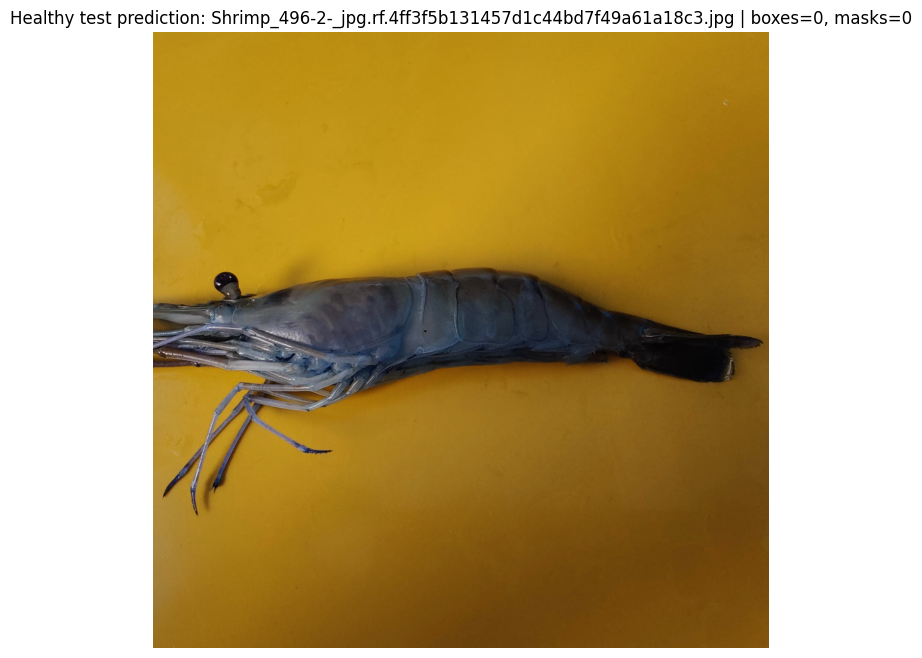

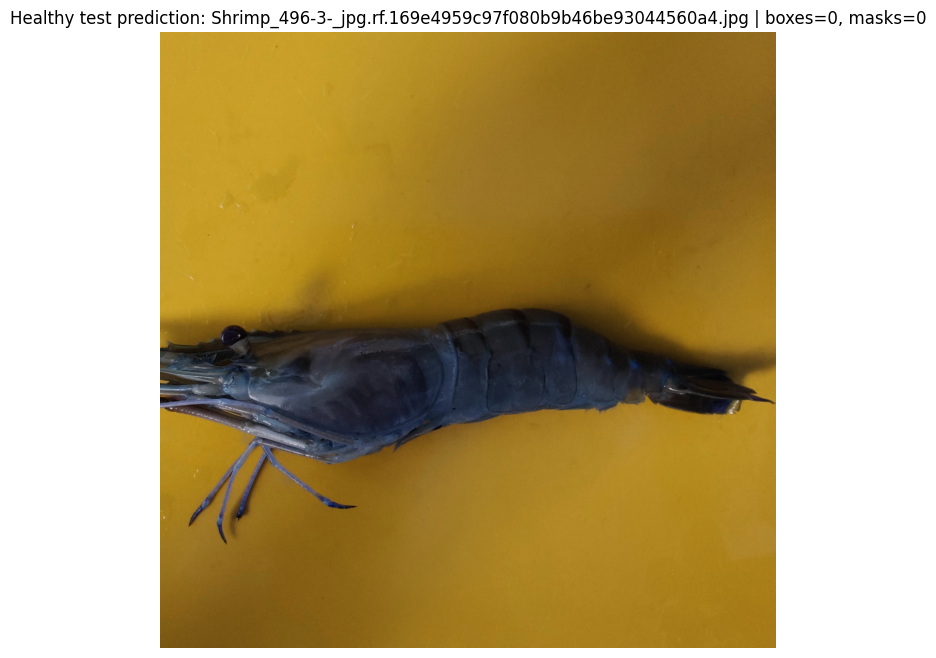

In [16]:
from ultralytics import YOLO
import glob
import matplotlib.pyplot as plt
import os
import random
import shutil
from pathlib import Path

import cv2
import numpy as np
import yaml

IMAGE_EXTENSIONS = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

COUNT_PENALTY_WEIGHT = 0.02
DISEASE_MISS_PENALTY_WEIGHT = 0.50
HEALTHY_FP_PENALTY_WEIGHT = 0.50


def metric_value(metrics, dotted_name, default=0.0):
    value = metrics
    try:
        for part in dotted_name.split('.'):
            value = getattr(value, part)
        return float(value)
    except Exception:
        return default


def healthy_false_positive_summary(model, image_dir, conf=0.25):
    image_dir = Path(image_dir)
    images = []
    for ext in IMAGE_EXTENSIONS:
        images.extend(image_dir.glob(f'*{ext}'))
    images = sorted(images)

    if not images:
        return {
            'healthy_image_count': 0,
            'healthy_mask_fp_rate': 0.0,
            'healthy_box_fp_rate': 0.0,
            'healthy_fp_masks_per_image': 0.0,
            'healthy_fp_boxes_per_image': 0.0,
        }

    results = model.predict(source=[str(p) for p in images], conf=conf, save=False, verbose=False)
    fp_mask_images = 0
    fp_box_images = 0
    total_masks = 0
    total_boxes = 0

    for result in results:
        mask_count = len(result.masks) if result.masks is not None else 0
        box_count = len(result.boxes) if result.boxes is not None else 0
        total_masks += mask_count
        total_boxes += box_count
        fp_mask_images += int(mask_count > 0)
        fp_box_images += int(box_count > 0)

    n = len(images)
    return {
        'healthy_image_count': n,
        'healthy_mask_fp_rate': fp_mask_images / n,
        'healthy_box_fp_rate': fp_box_images / n,
        'healthy_fp_masks_per_image': total_masks / n,
        'healthy_fp_boxes_per_image': total_boxes / n,
    }


def has_nonempty_label(label_path):
    return Path(label_path).exists() and bool(Path(label_path).read_text().strip())


def copy_eval_subset(source_dataset_dir, target_dataset_dir, keep_labeled):
    source_dataset_dir = Path(source_dataset_dir)
    target_dataset_dir = Path(target_dataset_dir)
    image_out = target_dataset_dir / 'test' / 'images'
    label_out = target_dataset_dir / 'test' / 'labels'
    image_out.mkdir(parents=True, exist_ok=True)
    label_out.mkdir(parents=True, exist_ok=True)

    copied = 0
    source_image_dir = source_dataset_dir / 'test' / 'images'
    source_label_dir = source_dataset_dir / 'test' / 'labels'

    for ext in IMAGE_EXTENSIONS:
        for image_path in source_image_dir.glob(f'*{ext}'):
            label_path = source_label_dir / f'{image_path.stem}.txt'
            labeled = has_nonempty_label(label_path)
            if labeled != keep_labeled:
                continue

            shutil.copy2(image_path, image_out / image_path.name)
            if label_path.exists():
                shutil.copy2(label_path, label_out / label_path.name)
            else:
                (label_out / f'{image_path.stem}.txt').write_text('')
            copied += 1

    return copied


def write_eval_yaml(source_yaml, target_yaml, target_dataset_dir):
    source_yaml = Path(source_yaml)
    target_yaml = Path(target_yaml)
    target_dataset_dir = Path(target_dataset_dir)
    with open(source_yaml, 'r') as f:
        cfg = yaml.safe_load(f)

    cfg['train'] = str(target_dataset_dir / 'test' / 'images')
    cfg['val'] = str(target_dataset_dir / 'test' / 'images')
    cfg['test'] = str(target_dataset_dir / 'test' / 'images')

    target_yaml.parent.mkdir(parents=True, exist_ok=True)
    with open(target_yaml, 'w') as f:
        yaml.safe_dump(cfg, f, sort_keys=False)
    return cfg


model_inference = YOLO(str(best_model_path))
selected_exp = BEST_RUN['experiment'] if 'BEST_RUN' in globals() else run_path.name
selected_dataset_dir = EXPERIMENT_ROOT / selected_exp / 'dataset' if 'EXPERIMENT_ROOT' in globals() and 'BEST_RUN' in globals() else Path('/content/ewu_shrimp_disease-1')
selected_yaml = selected_dataset_dir / 'data.yaml'
selected_labeled_dir = REPORT_DIR / 'dataset_labeled_only_eval'
selected_labeled_yaml = selected_labeled_dir / 'data_labeled_only.yaml'
selected_healthy_dir = REPORT_DIR / 'dataset_healthy_only_eval'
selected_healthy_yaml = selected_healthy_dir / 'data_healthy_only.yaml'

labeled_count = copy_eval_subset(selected_dataset_dir, selected_labeled_dir, keep_labeled=True)
healthy_count = copy_eval_subset(selected_dataset_dir, selected_healthy_dir, keep_labeled=False)
labeled_cfg = write_eval_yaml(selected_yaml, selected_labeled_yaml, selected_labeled_dir)
healthy_cfg = write_eval_yaml(selected_yaml, selected_healthy_yaml, selected_healthy_dir)
class_names = labeled_cfg.get('names', [])

print('Selected experiment:', selected_exp)
print('Selected dataset dir:', selected_dataset_dir)
print('Labeled-only test images:', labeled_count)
print('Healthy-only test images:', healthy_count)

print('Full test-set evaluation:')
full_test_metrics = model_inference.val(data=str(selected_yaml), split='test', imgsz=640, plots=True, verbose=False)
print('Labeled-only diseased test-set evaluation:')
labeled_test_metrics = model_inference.val(data=str(selected_labeled_yaml), split='test', imgsz=640, plots=False, verbose=False)
healthy_test_fp = healthy_false_positive_summary(model_inference, selected_healthy_dir / 'test' / 'images')

print('Full test mask mAP50:', metric_value(full_test_metrics, 'seg.map50'))
print('Labeled-only diseased test mask mAP50:', metric_value(labeled_test_metrics, 'seg.map50'))
print('Healthy test mask false-positive rate:', healthy_test_fp['healthy_mask_fp_rate'])
print('Healthy test false-positive masks per image:', healthy_test_fp['healthy_fp_masks_per_image'])


def draw_yolo_segmentation_labels(image_path, label_path):
    image = cv2.imread(str(image_path))
    if image is None:
        raise FileNotFoundError(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width = image.shape[:2]
    overlay = image.copy()
    colors = [(255, 70, 70), (70, 180, 255), (90, 220, 120), (240, 180, 60)]

    if label_path.exists():
        for line in label_path.read_text().splitlines():
            parts = line.strip().split()
            if len(parts) < 7:
                continue
            cls_id = int(float(parts[0]))
            coords = np.array([float(v) for v in parts[1:]], dtype=np.float32).reshape(-1, 2)
            coords[:, 0] *= width
            coords[:, 1] *= height
            pts = coords.astype(np.int32)
            color = colors[cls_id % len(colors)]
            cv2.polylines(overlay, [pts], isClosed=True, color=color, thickness=2)
            cv2.fillPoly(overlay, [pts], color=color)
            x, y = pts[0]
            label = class_names[cls_id] if cls_id < len(class_names) else str(cls_id)
            cv2.putText(overlay, label, (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

    return cv2.addWeighted(overlay, 0.35, image, 0.65, 0)


# Visualize augmented training ground-truth masks directly.
aug_images = sorted((selected_dataset_dir / 'train' / 'images').glob('aug_*'))
random.seed(42)
aug_images = random.sample(aug_images, k=min(6, len(aug_images)))

if aug_images:
    fig, axes = plt.subplots(len(aug_images), 1, figsize=(10, 5 * len(aug_images)))
    if len(aug_images) == 1:
        axes = [axes]
    for ax, image_path in zip(axes, aug_images):
        label_path = selected_dataset_dir / 'train' / 'labels' / f'{image_path.stem}.txt'
        ax.imshow(draw_yolo_segmentation_labels(image_path, label_path))
        ax.set_title(f'Augmented train GT mask: {image_path.name} | label exists={label_path.exists()}')
        ax.axis('off')
    plt.show()
else:
    print('No augmented training images found to visualize.')

# Visualize labeled test predictions.
test_images = []
for ext in IMAGE_EXTENSIONS:
    test_images.extend((selected_dataset_dir / 'test' / 'images').glob(f'*{ext}'))

def has_nonempty_test_label(image_path):
    label_path = selected_dataset_dir / 'test' / 'labels' / f'{image_path.stem}.txt'
    return label_path.exists() and bool(label_path.read_text().strip())

test_images = [p for p in sorted(test_images) if has_nonempty_test_label(p)]
test_images = test_images[:8]

results = model_inference.predict(source=[str(p) for p in test_images], conf=0.1, save=True, verbose=False)
for image_path, result in zip(test_images, results):
    plt.figure(figsize=(8, 8))
    plt.imshow(result.plot())
    plt.title(f'Labeled test prediction: {image_path.name} (conf > 0.1)')
    plt.axis('off')
    plt.show()

# Visualize healthy negative predictions to inspect false positives.
healthy_images = []
for ext in IMAGE_EXTENSIONS:
    healthy_images.extend((selected_healthy_dir / 'test' / 'images').glob(f'*{ext}'))
healthy_images = sorted(healthy_images)[:8]

if healthy_images:
    healthy_results = model_inference.predict(source=[str(p) for p in healthy_images], conf=0.1, save=False, verbose=False)
    for image_path, result in zip(healthy_images, healthy_results):
        plt.figure(figsize=(8, 8))
        plt.imshow(result.plot())
        box_count = len(result.boxes) if result.boxes is not None else 0
        mask_count = len(result.masks) if result.masks is not None else 0
        plt.title(f'Healthy test prediction: {image_path.name} | boxes={box_count}, masks={mask_count}')
        plt.axis('off')
        plt.show()
else:
    print('No healthy test images found to visualize.')


**Missed Box Metric**


In [17]:
from collections import Counter
from pathlib import Path
from PIL import Image
import torch
import yaml

MISS_SPLIT = "val"  # Change to "test" if needed.
MISS_IOU_THRESHOLD = 0.50
MISS_CONF_THRESHOLD = 0.25
IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}


def class_name(names, class_id):
    if isinstance(names, dict):
        return names.get(class_id, names.get(str(class_id), str(class_id)))
    if isinstance(names, list) and class_id < len(names):
        return names[class_id]
    return str(class_id)


def image_label_path(image_path):
    image_path = Path(image_path)
    if image_path.parent.name == "images":
        return image_path.parent.parent / "labels" / f"{image_path.stem}.txt"
    return image_path.with_suffix(".txt")


def read_yolo_seg_boxes(label_path, image_path):
    if not Path(label_path).exists():
        return []

    width, height = Image.open(image_path).size
    boxes = []
    for line in Path(label_path).read_text().splitlines():
        parts = line.strip().split()
        if len(parts) < 5:
            continue

        cls = int(float(parts[0]))
        vals = [float(x) for x in parts[1:]]

        if len(vals) == 4:
            x, y, w, h = vals
            x1 = (x - w / 2) * width
            y1 = (y - h / 2) * height
            x2 = (x + w / 2) * width
            y2 = (y + h / 2) * height
        else:
            xs = vals[0::2]
            ys = vals[1::2]
            x1 = min(xs) * width
            y1 = min(ys) * height
            x2 = max(xs) * width
            y2 = max(ys) * height

        boxes.append({"cls": cls, "box": torch.tensor([x1, y1, x2, y2], dtype=torch.float32)})
    return boxes


def box_iou(box, boxes):
    if boxes.numel() == 0:
        return torch.empty(0)

    x1 = torch.maximum(box[0], boxes[:, 0])
    y1 = torch.maximum(box[1], boxes[:, 1])
    x2 = torch.minimum(box[2], boxes[:, 2])
    y2 = torch.minimum(box[3], boxes[:, 3])

    inter = (x2 - x1).clamp(min=0) * (y2 - y1).clamp(min=0)
    area1 = (box[2] - box[0]).clamp(min=0) * (box[3] - box[1]).clamp(min=0)
    area2 = (boxes[:, 2] - boxes[:, 0]).clamp(min=0) * (boxes[:, 3] - boxes[:, 1]).clamp(min=0)
    return inter / (area1 + area2 - inter + 1e-9)


with open(DATA_YAML, "r") as f:
    data_cfg = yaml.safe_load(f)

split_source = Path(data_cfg.get(MISS_SPLIT, ""))
if not split_source.is_absolute():
    split_source = Path(DATA_YAML).parent / split_source

image_paths = sorted(p for p in split_source.rglob("*") if p.suffix.lower() in IMAGE_EXTS)

pred_results = best_model.predict(
    source=[str(p) for p in image_paths],
    imgsz=640,
    conf=MISS_CONF_THRESHOLD,
    iou=0.5,
    device=0,
    save=False,
    verbose=False,
)

gt_by_class = Counter()
missed_by_class = Counter()
total_gt = 0
total_missed = 0

for image_path, result in zip(image_paths, pred_results):
    gt_items = read_yolo_seg_boxes(image_label_path(image_path), image_path)
    total_gt += len(gt_items)

    if result.boxes is None or len(result.boxes) == 0:
        pred_boxes = torch.empty((0, 4), dtype=torch.float32)
        pred_classes = torch.empty((0,), dtype=torch.long)
    else:
        pred_boxes = result.boxes.xyxy.detach().cpu().float()
        pred_classes = result.boxes.cls.detach().cpu().long()

    matched_pred = set()
    for gt in gt_items:
        gt_cls = gt["cls"]
        gt_by_class[gt_cls] += 1
        candidates = [
            i for i, pred_cls in enumerate(pred_classes.tolist())
            if pred_cls == gt_cls and i not in matched_pred
        ]

        matched = False
        if candidates:
            candidate_boxes = pred_boxes[candidates]
            ious = box_iou(gt["box"], candidate_boxes)
            best_iou, best_local_idx = torch.max(ious, dim=0)
            if float(best_iou) >= MISS_IOU_THRESHOLD:
                matched_pred.add(candidates[int(best_local_idx)])
                matched = True

        if not matched:
            missed_by_class[gt_cls] += 1
            total_missed += 1

detected_gt = total_gt - total_missed

print("Missed-box split:", MISS_SPLIT)
print("Total GT boxes:", total_gt)
print("Detected GT boxes:", detected_gt)
print("Missed GT boxes:", total_missed)
print("Missed-box rate:", total_missed / total_gt if total_gt else 0.0)
print("Box recall by count:", detected_gt / total_gt if total_gt else 0.0)

print("\nMissed boxes by class:")
for cls_id in sorted(gt_by_class):
    gt_count = gt_by_class[cls_id]
    missed_count = missed_by_class[cls_id]
    print(
        f"  {class_name(data_cfg.get('names', best_model.names), cls_id)}: "
        f"missed {missed_count}/{gt_count} "
        f"({missed_count / gt_count if gt_count else 0.0:.4f})"
    )


Missed-box split: val
Total GT boxes: 109
Detected GT boxes: 27
Missed GT boxes: 82
Missed-box rate: 0.7522935779816514
Box recall by count: 0.24770642201834864

Missed boxes by class:
  blackgill: missed 4/8 (0.5000)
  whitespot: missed 78/101 (0.7723)


**Visualize Predictions**


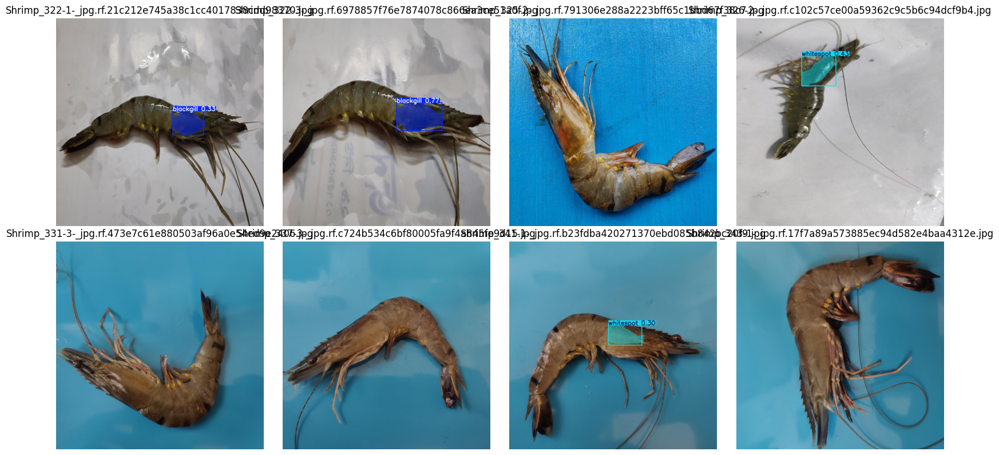

In [18]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

predict_dir = Path("/content/runs/predict_shrimp_cbam_simam/cbam_simam_predict")
image_exts = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
images = sorted([p for p in predict_dir.rglob("*") if p.suffix.lower() in image_exts]) if predict_dir.exists() else []

if not images:
    print(f"No prediction images found in {predict_dir}")
else:
    show_images = images[:8]
    cols = min(4, len(show_images))
    rows = (len(show_images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = [axes] if len(show_images) == 1 else axes.flatten()

    for ax, img_path in zip(axes, show_images):
        ax.imshow(Image.open(img_path))
        ax.set_title(img_path.name)
        ax.axis("off")

    for ax in axes[len(show_images):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()
